In [1]:
#region Basic_Import
## Basic
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.path.dirname(os.path.abspath('__file__'))
import sys
sys.path.append(os.path.dirname(os.path.abspath(os.path.dirname('__file__'))))

import warnings
warnings.filterwarnings('ignore')

import numpy as np, pandas as pd
from pandas import DataFrame, Series

import math, random

## Datetime
import time
import datetime as dt
from datetime import datetime, date, timedelta

import glob
from glob import glob
import requests
import json

## 시각화
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 8]

from scipy import stats

# K-Means 알고리즘
from sklearn.cluster import KMeans, MiniBatchKMeans

# CLustering 알고리즘의 성능 평가 측도
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score, adjusted_rand_score, silhouette_score, rand_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics.cluster import contingency_matrix

## 정규화
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn import metrics

import urllib
from urllib.request import urlopen
from urllib.parse import urlencode, unquote, quote_plus

from selenium import webdriver
from selenium.webdriver.chrome.service import Service

from webdriver_manager.chrome import ChromeDriverManager
from bs4 import BeautifulSoup

from tqdm.notebook import tqdm
import tqdm

## XAI : Shap
import shap

## Init.
pd.options.display.float_format = '{:.10f}'.format
#endregion Basic_Import

In [2]:
## Import_DL
str_tar = "tf"
## For Torch
if str_tar == "torch":
    import torch
    import torch.nn as nn
    from torch.nn.utils import weight_norm
    print("Torch Imported")
## For TF
elif str_tar == "tf":
    import tensorflow as tf
    import tensorflow_addons as tfa
    from keras.callbacks import EarlyStopping, ModelCheckpoint
    from keras.models import Sequential, load_model
    from keras_flops import get_flops
    print("Tensorflow Imported")
else:
    print("Error : Cannot be used except for Keywords")
    print(" : torch / tf")

Tensorflow Imported


In [3]:
## Import_Local
from Src_Dev_Common import Data_Datetime as com_date
# from Src_Dev_Common import DEV_KASI_Holiday as com_Holi
# from Src_Dev_Common import DEV_Common_Data_Analysis as com_Analysis
from Src_Dev_Common import Data_Preprocessing as com_Prep
from Src_Dev_Common import Common_Model as com_Model
# from Src_Dev_Common import DEV_Common_Data_Visualization as com_Visual
# from Src_Dev_Common import DEV_KMA_Weather_ASOS as com_ASOS
# from Src_Dev_Common import DEV_KDHC_Usage as com_KDHC
# from Src_Dev_Common import DEV_KIER_Usage as com_KIER

In [4]:
## LGBM
from catboost import Pool, CatBoostRegressor

## Data Load

In [5]:
## Raw Data Load
df_KIER_5Domain = pd.read_csv('KIER_Merged_5domain_2024-07-08.csv', index_col = 0)
# df_KIER_5Domain['METER_DATE'] = pd.to_datetime(df_KIER_5Domain['METER_DATE'])

back_data = df_KIER_5Domain.drop(['METER_DATE', 'YEAR'], axis=1)

print(df_KIER_5Domain.shape, "///", df_KIER_5Domain.columns)
df_KIER_5Domain

(16413, 29) /// Index(['METER_DATE', 'YEAR', 'MONTH', 'DAY', 'code_day_of_the_week', 'HOUR',
       'MINUTE', 'temp_outdoor', 'temp_dew_point', 'temp_ground', 'humidity',
       'rainfall', 'snowfall', 'snowfall_3hr', 'wind_speed', 'wind_direction',
       'pressure_vapor', 'pressure_area', 'pressure_sea', 'sunshine',
       'solar_radiation', 'cloud_total', 'cloud_midlow', 'visual_range',
       'ELEC_INST', 'HEAT_INST', 'WATER_INST', 'HOT_INST', 'GAS_INST'],
      dtype='object')


,METER_DATE,YEAR,MONTH,DAY,code_day_of_the_week,HOUR,MINUTE,temp_outdoor,temp_dew_point,temp_ground,...,sunshine,solar_radiation,cloud_total,cloud_midlow,visual_range,ELEC_INST,HEAT_INST,WATER_INST,HOT_INST,GAS_INST
0,2022-07-20 13:00:00,2022,7,20,2,13,0,29.8000000000,21.4000000000,41.5000000000,...,1.0000000000,2.8900000000,8.0000000000,2.0000000000,1903.0000000000,194.7787303232,0.0001975346,7.0350500000,0.0000093275,0.0000000000
1,2022-07-20 14:00:00,2022,7,20,2,14,0,30.4000000000,20.0000000000,42.4000000000,...,1.0000000000,2.8500000000,8.0000000000,1.0000000000,1986.0000000000,185.5468089258,0.0001975346,7.0453500000,0.0000031403,0.0003690685
2,2022-07-20 15:00:00,2022,7,20,2,15,0,30.5000000000,21.0000000000,41.9000000000,...,0.8000000000,2.3800000000,7.0000000000,2.0000000000,1985.0000000000,191.8368089258,0.0001975346,6.4400500000,0.0000034357,0.0102684149
3,2022-07-20 16:00:00,2022,7,20,2,16,0,30.8000000000,20.7000000000,39.7000000000,...,1.0000000000,2.1900000000,5.0000000000,3.0000000000,1993.0000000000,185.9038264696,0.0001975346,7.4170000000,0.0000072374,0.0218035922
4,2022-07-20 17:00:00,2022,7,20,2,17,0,29.5000000000,20.0000000000,34.5000000000,...,0.3000000000,1.0200000000,9.0000000000,1.0000000000,2000.0000000000,189.2517825136,0.0001975346,10.2510000000,0.0000123613,0.0218035922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16408,2024-06-03 05:00:00,2024,6,3,0,5,0,13.1000000000,10.8000000000,14.7000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,2976.0000000000,80.6379999998,0.0000000000,6.0601202899,0.0000305033,0.0000000000
16409,2024-06-03 06:00:00,2024,6,3,0,6,0,13.7000000000,10.8000000000,15.0000000000,...,0.1000000000,0.0500000000,0.0000000000,0.0000000000,3874.0000000000,85.4079999998,0.0000000000,8.2929202899,0.0000944223,0.1200000000
16410,2024-06-03 07:00:00,2024,6,3,0,7,0,18.0000000000,11.9000000000,17.0000000000,...,1.0000000000,0.5600000000,0.0000000000,0.0000000000,5000.0000000000,111.6829999997,0.0000000000,11.7601202899,0.0002607810,0.3600000000
16411,2024-06-03 08:00:00,2024,6,3,0,8,0,19.7000000000,12.2000000000,22.5000000000,...,1.0000000000,1.2500000000,0.0000000000,0.0000000000,5000.0000000000,121.9929999998,0.0000000000,9.9387202899,0.0000540724,0.3800000000


In [6]:
## 소요 시간이 커서 생략
## Raw Data Check
# for str_domain in ['ELEC', 'HEAT', 'WATER', 'HOT', 'GAS']:
#     plt.figure(figsize=(30,5))
#     plt.plot(df_KIER_5Domain['METER_DATE'], df_KIER_5Domain[str_domain + '_INST'], color='skyblue', label='True')
#     plt.title(str_domain, fontsize = 30)
#     plt.legend(fontsize = 20)
#     plt.show()

## Execute

In [7]:
def buildDataSet(input, target, seqLength):
    xdata = []
    ydata = []
    for i in range(len(input) - seqLength):
        tx = input.iloc[i:i+seqLength]
        ty = target.iloc[i+seqLength-1]
        xdata.append(tx)
        ydata.append(ty)
    return np.array(xdata), np.array(ydata)

In [8]:
def seq2seq_model(input_shape):
    model_input = tf.keras.layers.Input(shape=input_shape)

    # for feature extracting
    conv1 = tf.keras.layers.Conv1D(128, 1, activation='swish')(model_input)
    pool1 = tf.keras.layers.MaxPool1D(pool_size=2, strides=1, padding='same')(conv1)
    conv2 = tf.keras.layers.Conv1D(64, 1, activation='swish')(pool1)
    pool2 = tf.keras.layers.MaxPool1D(pool_size=2, strides=1, padding='same')(conv2)
    conv3 = tf.keras.layers.Conv1D(32, 1, activation='swish')(pool2) #
    pool3 = tf.keras.layers.MaxPool1D(pool_size=2, strides=1, padding='same')(conv3)#

    # 인코더 - 디코더 선언
    encoder_lstm1 = tf.keras.layers.LSTM(32, return_sequences=True, activation='tanh') #
    encoder_lstm2 = tf.keras.layers.LSTM(64, return_sequences=True, activation='tanh')
    encoder_lstm3 = tf.keras.layers.LSTM(128, return_state=True, return_sequences=True, activation='tanh')

    decoder_lstm1 = tf.keras.layers.LSTM(128, return_sequences=True, activation='tanh')
    decoder_lstm2 = tf.keras.layers.LSTM(64, return_sequences=True, activation='tanh')
    decoder_lstm3 = tf.keras.layers.LSTM(32, return_sequences=True, activation='tanh') #

    # 인코더
    encoder_output_lstm1 = encoder_lstm1(pool3) #
    encoder_output_lstm2 = encoder_lstm2(encoder_output_lstm1)
    encoder_output_lstm3, state_h, state_c = encoder_lstm3(encoder_output_lstm2)

    #디코더
    decoder_lstm1_output = decoder_lstm1(encoder_output_lstm3, initial_state=[state_h, state_c])
    decoder_lstm2_output = decoder_lstm2(decoder_lstm1_output)
    decoder_lstm3_output = decoder_lstm3(decoder_lstm2_output) #

    flatten = tf.keras.layers.Flatten()(decoder_lstm3_output)
    model_output = tf.keras.layers.Dense(1)(flatten)
    
    model = tf.keras.models.Model(model_input, model_output)
    
    return model

In [9]:
# 정규화 되돌리기 함수 
def back_MinMax(data, value):
    diff = np.max(data, axis=0)-np.min(data, axis=0)
    back = value * diff + np.min(data, axis=0)
    return back 

Epoch 1/300
45/45 [==============================] - 4s 14ms/step - loss: 0.1732 - mse: 0.0461
Epoch 2/300
45/45 [==============================] - 1s 13ms/step - loss: 0.1146 - mse: 0.0246
Epoch 3/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0939 - mse: 0.0153
Epoch 4/300
45/45 [==============================] - 1s 14ms/step - loss: 0.0898 - mse: 0.0139
Epoch 5/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0816 - mse: 0.0113
Epoch 6/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0687 - mse: 0.0079
Epoch 7/300
45/45 [==============================] - 1s 14ms/step - loss: 0.0596 - mse: 0.0059
Epoch 8/300
45/45 [==============================] - 1s 14ms/step - loss: 0.0561 - mse: 0.0052
Epoch 9/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0540 - mse: 0.0048
Epoch 10/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0522 - mse: 0.0045
Epoch 11/300
45/45 [=============================

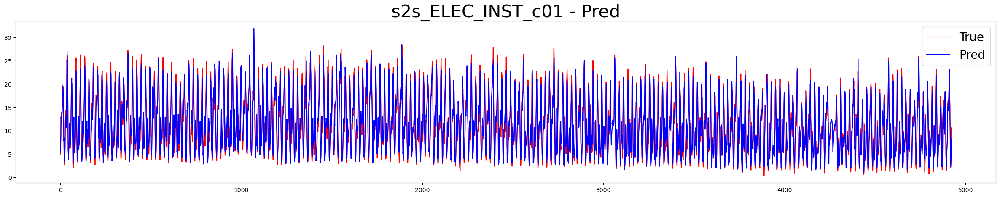

Epoch 1/300
45/45 [==============================] - 4s 14ms/step - loss: 0.0964 - mse: 0.0370
Epoch 2/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0916 - mse: 0.0355
Epoch 3/300
45/45 [==============================] - 1s 14ms/step - loss: 0.0915 - mse: 0.0356
Epoch 4/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0911 - mse: 0.0354
Epoch 5/300
45/45 [==============================] - 1s 14ms/step - loss: 0.0876 - mse: 0.0328
Epoch 6/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0724 - mse: 0.0192
Epoch 7/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0524 - mse: 0.0066
Epoch 8/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0401 - mse: 0.0044
Epoch 9/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0362 - mse: 0.0039
Epoch 10/300
45/45 [==============================] - 1s 13ms/step - loss: 0.0339 - mse: 0.0034
Epoch 11/300
45/45 [=============================

In [16]:
list_tar_col = ['ELEC_INST', 'HEAT_INST', 'WATER_INST', 'HOT_INST', 'GAS_INST']

## 모든 세대
for str_domain in list_tar_col :
    ## Scaling
    scaler_data = MinMaxScaler()
    scaler_data.fit(back_data)
    scaled_data = scaler_data.transform(back_data)

    new_data = pd.DataFrame(scaled_data, index=back_data.index, columns=back_data.columns)

    list_tar_col_02 = list_tar_col.copy()
    list_tar_col_02.remove(str_domain)

    df_X = new_data.drop(list_tar_col_02, axis=1).iloc[:-1,]
    df_Y = new_data[[str_domain]].iloc[1:,]

    trainX, testX, trainY, testY = train_test_split(df_X, df_Y, test_size=0.3, shuffle=False, random_state=0)

    trainx, trainy = buildDataSet(trainX, trainY, 1)
    testx, testy = buildDataSet(testX, testY, 1)

    model = seq2seq_model(input_shape=(1, 23))

    tm_start = time.time()
    # 모델 컴파일
    earlystopping = EarlyStopping(monitor='loss', patience=50)
    checkpoint = ModelCheckpoint(moniter='loss',filepath='s2s_elec_c01.h5')
    model.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])

    # 모델 요약 정보 출력
    hist_elec = model.fit(trainx, trainy, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

    tm_code = time.time() - tm_start

    pred_elec = back_MinMax(back_data.to_numpy()[:, [-3]], np.reshape(model.predict(testx), (-1,1)))
    real_elec = back_MinMax(back_data.to_numpy()[:, [-3]], testy)

    ## Code Time
    print('TIME : ', tm_code)

    str_model = 's2s_' + str_domain + '_c01'
    com_Model.model_sk_metrics(real_elec, pred_elec)
    com_Model.model_visualization(real_elec, pred_elec, str_model + ' - Pred')

## Data Split (Train/Test Setting)

Learning rate set to 0.114022
0:	learn: 39.8826182	test: 39.8826182	best: 39.8826182 (0)	total: 1.54ms	remaining: 769ms
50:	learn: 15.0160205	test: 15.0160205	best: 15.0160205 (50)	total: 59.6ms	remaining: 525ms
100:	learn: 12.8557890	test: 12.8557890	best: 12.8557890 (100)	total: 118ms	remaining: 467ms
150:	learn: 11.5986379	test: 11.5986379	best: 11.5986379 (150)	total: 177ms	remaining: 410ms
200:	learn: 10.8840449	test: 10.8840449	best: 10.8840449 (200)	total: 238ms	remaining: 354ms
250:	learn: 10.4048117	test: 10.4048117	best: 10.4048117 (250)	total: 297ms	remaining: 294ms
300:	learn: 10.0373599	test: 10.0373599	best: 10.0373599 (300)	total: 358ms	remaining: 237ms
350:	learn: 9.7336962	test: 9.7336962	best: 9.7336962 (350)	total: 423ms	remaining: 180ms
400:	learn: 9.4633462	test: 9.4633462	best: 9.4633462 (400)	total: 486ms	remaining: 120ms
450:	learn: 9.2222929	test: 9.2222929	best: 9.2222929 (450)	total: 551ms	remaining: 59.9ms
499:	learn: 9.0363184	test: 9.0363184	best: 9.036318

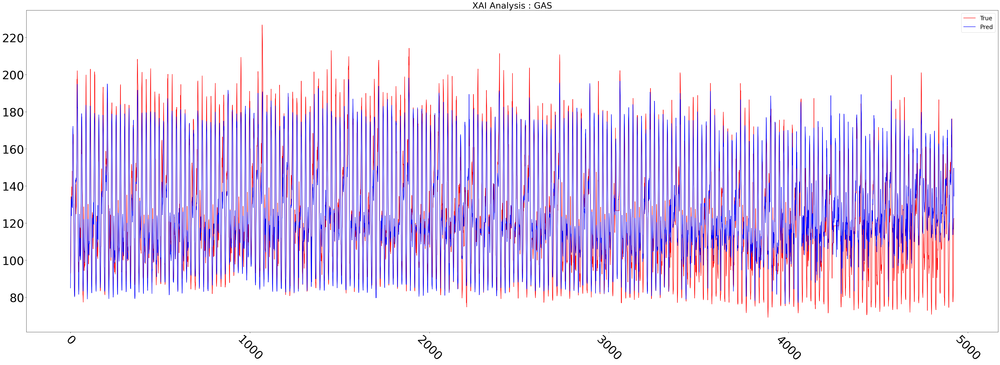

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Learning rate set to 0.114022
0:	learn: 0.1433145	test: 0.1433145	best: 0.1433145 (0)	total: 1.74ms	remaining: 870ms
50:	learn: 0.0419188	test: 0.0419188	best: 0.0419188 (50)	total: 61.9ms	remaining: 545ms
100:	learn: 0.0379435	test: 0.0379435	best: 0.0379435 (100)	total: 122ms	remaining: 481ms
150:	learn: 0.0353183	test: 0.0353183	best: 0.0353183 (150)	total: 178ms	remaining: 411ms
200:	learn: 0.0334090	test: 0.0334090	best: 0.0334090 (200)	total: 236ms	remaining: 351ms
250:	learn: 0.0319305	test: 0.0319305	best: 0.0319305 (250)	total: 294ms	remaining: 292ms
300:	learn: 0.0305439	test: 0.0305439	best: 0.0305439 (300)	total: 352ms	remaining: 233ms
350:	learn: 0.0294082	test: 0.0294082	best: 0.0294082 (350)	total: 414ms	remaining: 176ms
400:	learn: 0.0283669	test: 0.0283669	best: 0.0283669 (400)	total: 472ms	remaining: 116ms
450:	learn: 0.0275971	test: 0.0275971	best: 0.0275971 (450)	total: 528ms	remaining: 57.4ms
499:	learn: 0.0267574	test: 0.0267574	best: 0.0267574 (499)	total: 585ms	

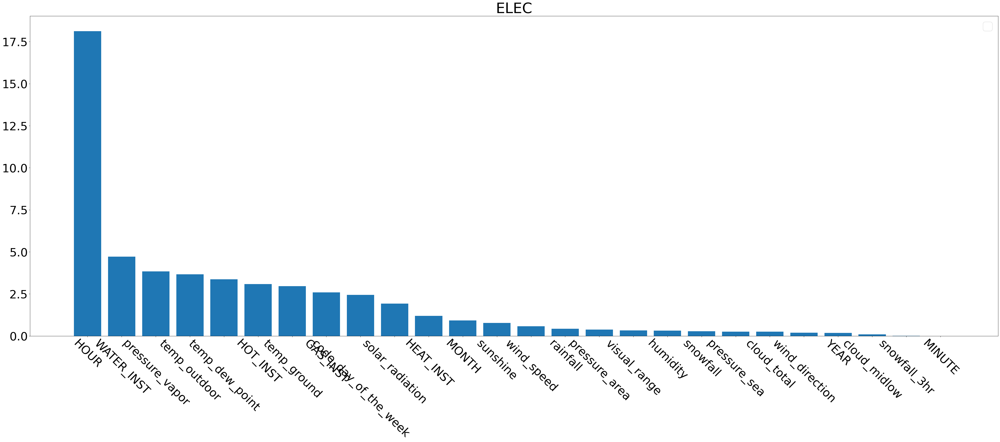

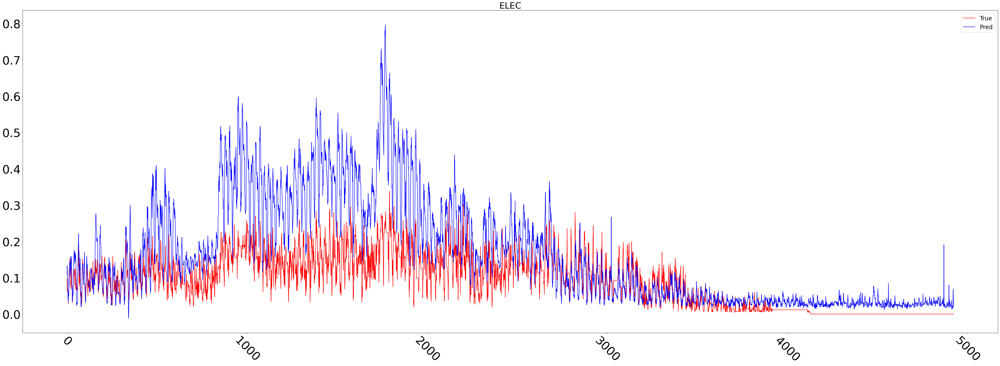

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Learning rate set to 0.114022
0:	learn: 3.0360839	test: 3.0360839	best: 3.0360839 (0)	total: 1.69ms	remaining: 841ms
50:	learn: 1.4405423	test: 1.4405423	best: 1.4405423 (50)	total: 67.3ms	remaining: 593ms
100:	learn: 1.2665929	test: 1.2665929	best: 1.2665929 (100)	total: 124ms	remaining: 491ms
150:	learn: 1.1473670	test: 1.1473670	best: 1.1473670 (150)	total: 181ms	remaining: 419ms
200:	learn: 1.0682294	test: 1.0682294	best: 1.0682294 (200)	total: 240ms	remaining: 357ms
250:	learn: 1.0193589	test: 1.0193589	best: 1.0193589 (250)	total: 297ms	remaining: 295ms
300:	learn: 0.9853227	test: 0.9853227	best: 0.9853227 (300)	total: 359ms	remaining: 237ms
350:	learn: 0.9586309	test: 0.9586309	best: 0.9586309 (350)	total: 417ms	remaining: 177ms
400:	learn: 0.9381696	test: 0.9381696	best: 0.9381696 (400)	total: 477ms	remaining: 118ms
450:	learn: 0.9207843	test: 0.9207843	best: 0.9207843 (450)	total: 535ms	remaining: 58.1ms
499:	learn: 0.9032624	test: 0.9032624	best: 0.9032624 (499)	total: 591ms	

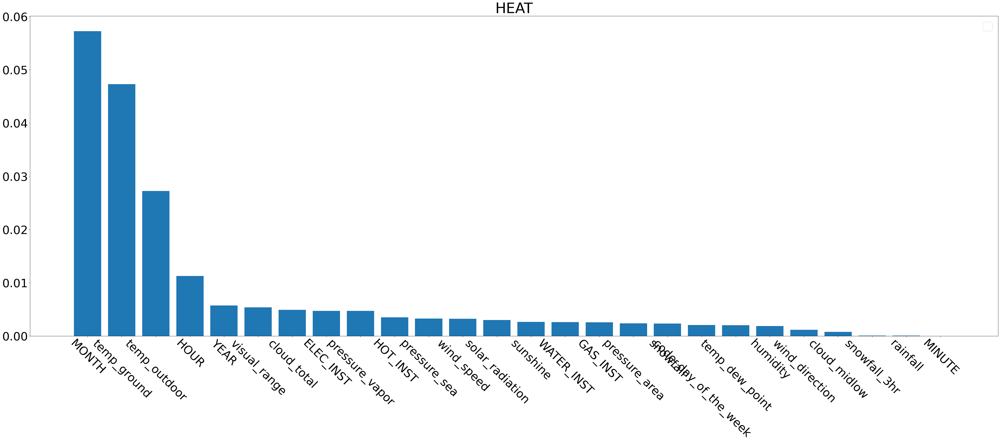

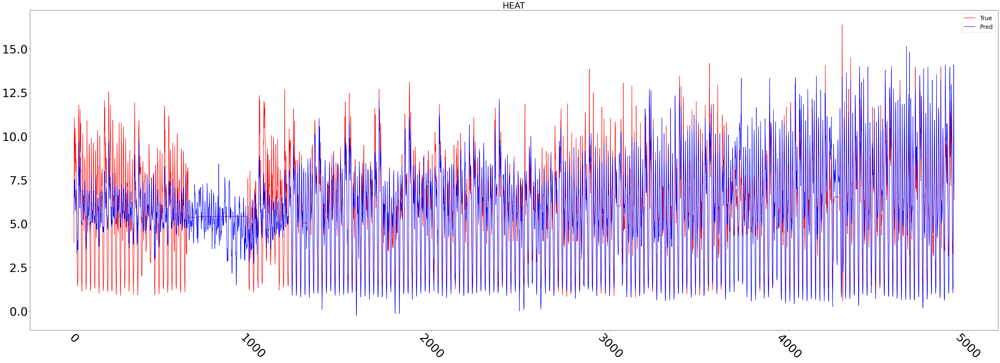

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Learning rate set to 0.114022
0:	learn: 0.0000454	test: 0.0000454	best: 0.0000454 (0)	total: 1.66ms	remaining: 826ms
50:	learn: 0.0000254	test: 0.0000254	best: 0.0000254 (50)	total: 62.6ms	remaining: 551ms
100:	learn: 0.0000239	test: 0.0000239	best: 0.0000239 (100)	total: 120ms	remaining: 473ms
150:	learn: 0.0000230	test: 0.0000230	best: 0.0000230 (150)	total: 176ms	remaining: 406ms
200:	learn: 0.0000223	test: 0.0000223	best: 0.0000223 (200)	total: 233ms	remaining: 346ms
250:	learn: 0.0000217	test: 0.0000217	best: 0.0000217 (250)	total: 289ms	remaining: 287ms
300:	learn: 0.0000212	test: 0.0000212	best: 0.0000212 (300)	total: 345ms	remaining: 228ms
350:	learn: 0.0000208	test: 0.0000208	best: 0.0000208 (350)	total: 407ms	remaining: 173ms
400:	learn: 0.0000203	test: 0.0000203	best: 0.0000203 (400)	total: 471ms	remaining: 116ms
450:	learn: 0.0000200	test: 0.0000200	best: 0.0000200 (450)	total: 528ms	remaining: 57.4ms
499:	learn: 0.0000196	test: 0.0000196	best: 0.0000196 (499)	total: 588ms	

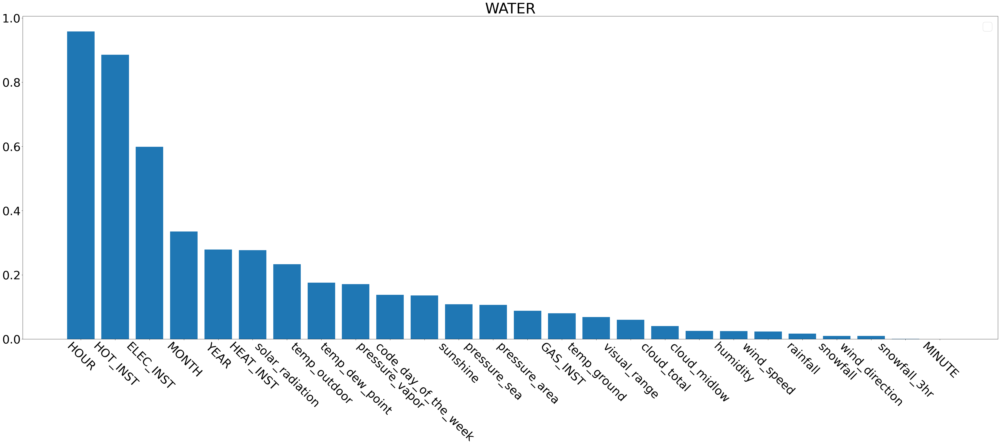

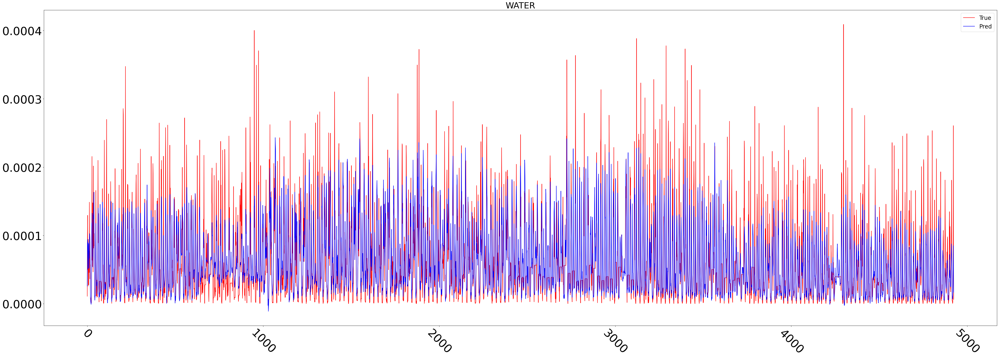

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Learning rate set to 0.114022
0:	learn: 0.2431472	test: 0.2431472	best: 0.2431472 (0)	total: 1.87ms	remaining: 932ms
50:	learn: 0.1893607	test: 0.1893607	best: 0.1893607 (50)	total: 59.5ms	remaining: 524ms
100:	learn: 0.1844400	test: 0.1844400	best: 0.1844400 (100)	total: 116ms	remaining: 459ms
150:	learn: 0.1803672	test: 0.1803672	best: 0.1803672 (150)	total: 172ms	remaining: 397ms
200:	learn: 0.1773311	test: 0.1773311	best: 0.1773311 (200)	total: 228ms	remaining: 339ms
250:	learn: 0.1742514	test: 0.1742514	best: 0.1742514 (250)	total: 283ms	remaining: 280ms
300:	learn: 0.1714512	test: 0.1714512	best: 0.1714512 (300)	total: 341ms	remaining: 225ms
350:	learn: 0.1689546	test: 0.1689546	best: 0.1689546 (350)	total: 403ms	remaining: 171ms
400:	learn: 0.1667314	test: 0.1667314	best: 0.1667314 (400)	total: 466ms	remaining: 115ms
450:	learn: 0.1647861	test: 0.1647861	best: 0.1647861 (450)	total: 529ms	remaining: 57.5ms
499:	learn: 0.1629766	test: 0.1629766	best: 0.1629766 (499)	total: 585ms	

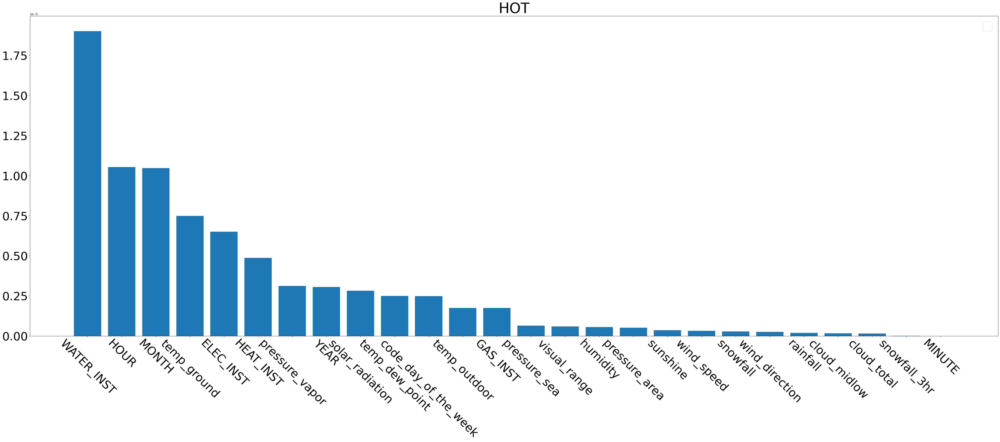

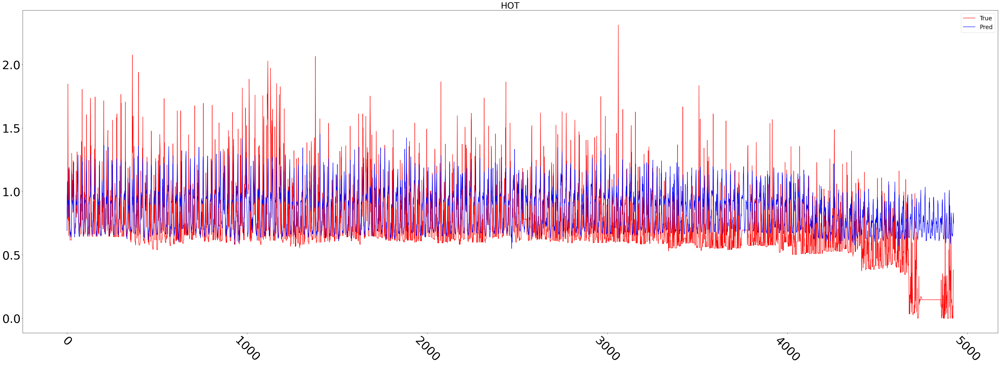

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


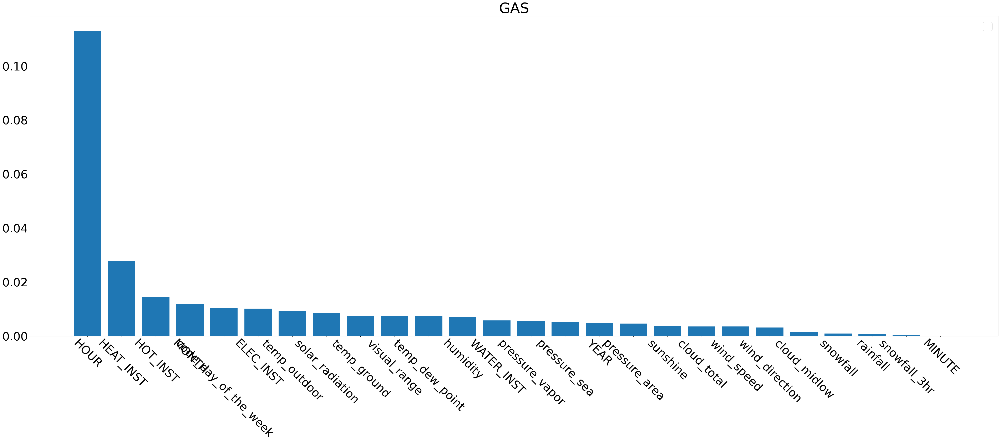

In [ ]:
## 모든 세대
for str_domain in ['ELEC', 'HEAT', 'WATER', 'HOT', 'GAS']:
    str_col_tar = str_domain + '_INST'
    df_raw = df_KIER_5Domain.drop(columns = ['METER_DATE', 'DAY']).dropna()

    trainSet_Origin, testSet_Origin = train_test_split(df_raw, test_size=0.3, shuffle=False)
    
    trainSet, testSet = trainSet_Origin, testSet_Origin
    trainXX, trainYY = trainSet.drop([str_col_tar],axis=1), trainSet[[str_col_tar]]
    testXX, testYY = testSet.drop([str_col_tar],axis=1), testSet[[str_col_tar]]

    trainXXindex, trainXXcolumns = trainXX.index, trainXX.columns
    trainYYindex, trainYYcolumns = trainYY.index, trainYY.columns
    testXXindex, testXXcolumns = testXX.index, testXX.columns
    testYYindex, testYYcolumns = testYY.index, testYY.columns

    d_trainXX, d_trainYY = pd.DataFrame(trainXX, index=trainXXindex, columns=trainXXcolumns), trainYY
    d_testXX, d_testYY = pd.DataFrame(testXX, index=testXXindex, columns=testXXcolumns), testYY

    ## CB
    earlystopping = EarlyStopping(monitor='loss', patience=50)
    checkpoint = ModelCheckpoint(moniter='loss',filepath='cb_' + str_domain + '.h5')

    model = CatBoostRegressor(iterations = 500, max_ctr_complexity = 4, random_seed = 0
                            , od_type = 'Iter', od_wait = 25, verbose = 50, depth = 4) #10000
    
    tm_start = time.time()

    cb_model = model.fit(trainXX, trainYY, cat_features = [],eval_set=[(trainXX, trainYY)])

    tm_code = time.time() - tm_start

    model_pred = cb_model.predict(testXX)
    model_preds=np.reshape(model_pred,(-1,1))

    d_actual = testYY.to_numpy()
    d_actual = np.reshape(d_actual,(-1,1))

    ## Code Time
    print('TIME : ', tm_code)

    com_Model.model_sk_metrics(d_actual, model_pred)
    plt.figure(figsize=(60,20))
    plt.plot(d_actual,color='red',label='True')
    plt.plot(model_pred,color='blue',label='Pred')
    plt.title(str_title, fontsize = 30)
    plt.xticks(fontsize = 40, rotation = -45)
    plt.yticks(fontsize = 40)
    plt.legend(fontsize = 20)
    plt.show()

    ## XAI 분석
    # Tree model Shap Value 확인 객체 지정
    explainer = shap.TreeExplainer(cb_model) 
    shap_values = explainer(testXX) # Shap Values 계산
    shap.initjs() # javascript 초기화 (graph 초기화)

    list_shapvalue = []

    for i in range(0, len(shap_values.values)):
        for j in range(0, len(shap_values.values[i])):
            if i == 0: list_shapvalue.append(shap_values.values[i][j])
            else: list_shapvalue[j] = abs(list_shapvalue[j]) + abs(shap_values.values[i][j])

    for i in range(0, len(list_shapvalue)):
        list_shapvalue[i] = list_shapvalue[i]/len(shap_values.values)

    list_col = list(testXX.columns)
    row_shap = list_shapvalue

    df_shap = pd.DataFrame()
    for idx, col_tar in enumerate(list_col):
        df_shap.insert(loc = idx, column = col_tar, value = 0, allow_duplicates = False)

    df_shap.loc[0] = row_shap

    df_shap = df_shap.transpose().sort_values([0], ascending = False).transpose()

    plt.figure(figsize=(60,20))
    str_title = str_domain

    plt.bar(df_shap.columns, df_shap.iloc[0])
    plt.title(str_title, fontsize = 50)
    plt.legend(fontsize = 40)
    plt.xticks(fontsize = 40, rotation = -45)
    plt.yticks(fontsize = 40)

# df_raw

In [ ]:
import shap
# explainer = shap.explainers.Exact(cb_model) # Tree model Shap Value 확인 객체 지정
explainer = shap.TreeExplainer(cb_model) # Tree model Shap Value 확인 객체 지정
# shap_values = explainer(testXX) # Shap Values 계산
shap_values = explainer(testXX) # Shap Values 계산

shap.initjs() # javascript 초기화 (graph 초기화)
# shap.force_plot(explainer.expected_value, shap_values[1,:], trainXX.iloc[1,:])

## 오류 수정 필요
# shap.dependence_plot(str_domain + '_INST', shap_values, testXX)
# shap.dependence_plot('HOUR', shap_values, testXX)

## Summary_plot
# shap.plots.bar(shap_values[0], max_display = 30)
# shap.plots.bar(shap_values, max_display = 30)
# shap.summary_plot(shap_values, testXX, max_display = 30, plot_type = "bar")
# shap.summary_plot(shap_values, testXX, plot_type = "dot")
# shap.summary_plot(shap_values, testXX, plot_type = "violin")

In [ ]:
list_shapvalue = []

for i in range(0, len(shap_values.values)):
    # print(i)
    for j in range(0, len(shap_values.values[i])):
        # print(j)
        # print(shap_values.values[i][j])
        if i == 0: list_shapvalue.append(shap_values.values[i][j])
        else: list_shapvalue[j] = abs(list_shapvalue[j]) + abs(shap_values.values[i][j])

for i in range(0, len(list_shapvalue)):
    list_shapvalue[i] = list_shapvalue[i]/len(shap_values.values)

print(testXX.columns)
print(list_shapvalue)

Index(['YEAR', 'MONTH', 'code_day_of_the_week', 'HOUR', 'MINUTE',
       'temp_outdoor', 'temp_dew_point', 'temp_ground', 'humidity', 'rainfall',
       'snowfall', 'snowfall_3hr', 'wind_speed', 'wind_direction',
       'pressure_vapor', 'pressure_area', 'pressure_sea', 'sunshine',
       'solar_radiation', 'cloud_total', 'cloud_midlow', 'visual_range',
       'ELEC_INST', 'HEAT_INST', 'WATER_INST', 'HOT_INST'],
      dtype='object')
[0.004743489560011352, 0.011721532269236418, 0.010234424290109227, 0.11284726021733127, 0.0, 0.009352349435976666, 0.007250253654127501, 0.007451497901849645, 0.00716864769305458, 0.0008499245432090753, 0.0009005498505986787, 0.0001985368983614771, 0.0034903509627353863, 0.003105662856815419, 0.0054137151189678715, 0.00459454794778127, 0.005112509852320761, 0.0037403241323832725, 0.008493326942971422, 0.003517110673884545, 0.0013868731790419569, 0.0073131014236692965, 0.010131468713227794, 0.027652272467894774, 0.005739017209723599, 0.014433752325740254]


In [ ]:
list_col = list(testXX.columns)
row_shap = list_shapvalue

df_shap = pd.DataFrame()
for idx, col_tar in enumerate(list_col):
    df_shap.insert(loc = idx, column = col_tar, value = 0, allow_duplicates = False)

df_shap.loc[0] = row_shap
df_shap

,YEAR,MONTH,code_day_of_the_week,HOUR,MINUTE,temp_outdoor,temp_dew_point,temp_ground,humidity,rainfall,...,pressure_sea,sunshine,solar_radiation,cloud_total,cloud_midlow,visual_range,ELEC_INST,HEAT_INST,WATER_INST,HOT_INST
0,0.0047434896,0.0117215323,0.0102344243,0.1128472602,0.0000000000,0.0093523494,0.0072502537,0.0074514979,0.0071686477,0.0008499245,...,0.0051125099,0.0037403241,0.0084933269,0.0035171107,0.0013868732,0.0073131014,0.0101314687,0.0276522725,0.0057390172,0.0144337523


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25],
 [Text(0, 0, 'HOUR'),
  Text(1, 0, 'HEAT_INST'),
  Text(2, 0, 'HOT_INST'),
  Text(3, 0, 'MONTH'),
  Text(4, 0, 'code_day_of_the_week'),
  Text(5, 0, 'ELEC_INST'),
  Text(6, 0, 'temp_outdoor'),
  Text(7, 0, 'solar_radiation'),
  Text(8, 0, 'temp_ground'),
  Text(9, 0, 'visual_range'),
  Text(10, 0, 'temp_dew_point'),
  Text(11, 0, 'humidity'),
  Text(12, 0, 'WATER_INST'),
  Text(13, 0, 'pressure_vapor'),
  Text(14, 0, 'pressure_sea'),
  Text(15, 0, 'YEAR'),
  Text(16, 0, 'pressure_area'),
  Text(17, 0, 'sunshine'),
  Text(18, 0, 'cloud_total'),
  Text(19, 0, 'wind_speed'),
  Text(20, 0, 'wind_direction'),
  Text(21, 0, 'cloud_midlow'),
  Text(22, 0, 'snowfall'),
  Text(23, 0, 'rainfall'),
  Text(24, 0, 'snowfall_3hr'),
  Text(25, 0, 'MINUTE')])

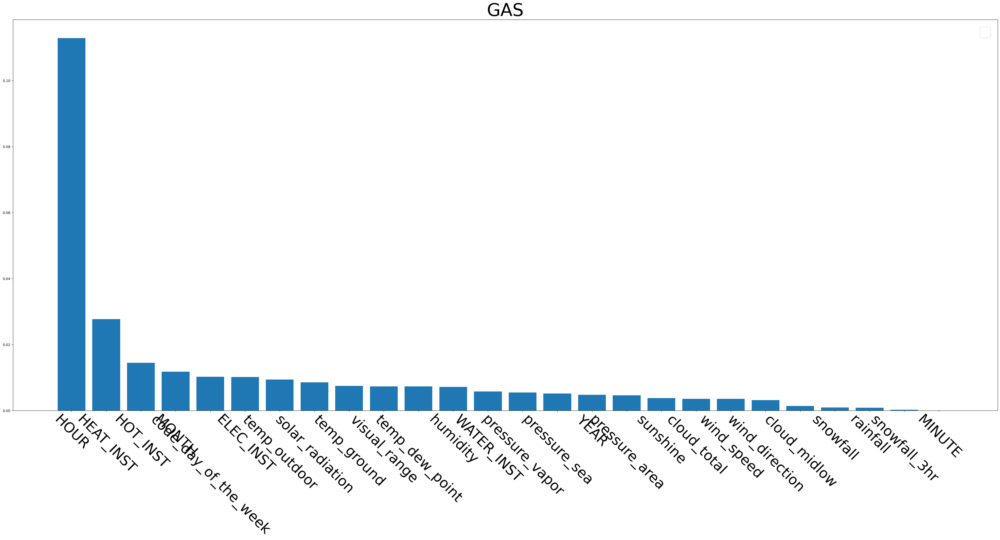

In [ ]:
df_shap_fin = df_shap.transpose().sort_values([0], ascending = False).transpose()

plt.figure(figsize=(50,20))
str_title = str_domain

plt.bar(df_shap_fin.columns, df_shap_fin.iloc[0])
plt.title(str_title, fontsize = 50)
plt.legend(fontsize = 40)
plt.xticks(fontsize = 40, rotation = -45)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25],
 [Text(0, 0, 'HOUR'),
  Text(1, 0, 'HEAT_INST'),
  Text(2, 0, 'HOT_INST'),
  Text(3, 0, 'MONTH'),
  Text(4, 0, 'code_day_of_the_week'),
  Text(5, 0, 'ELEC_INST'),
  Text(6, 0, 'temp_outdoor'),
  Text(7, 0, 'solar_radiation'),
  Text(8, 0, 'temp_ground'),
  Text(9, 0, 'visual_range'),
  Text(10, 0, 'temp_dew_point'),
  Text(11, 0, 'humidity'),
  Text(12, 0, 'WATER_INST'),
  Text(13, 0, 'pressure_vapor'),
  Text(14, 0, 'pressure_sea'),
  Text(15, 0, 'YEAR'),
  Text(16, 0, 'pressure_area'),
  Text(17, 0, 'sunshine'),
  Text(18, 0, 'cloud_total'),
  Text(19, 0, 'wind_speed'),
  Text(20, 0, 'wind_direction'),
  Text(21, 0, 'cloud_midlow'),
  Text(22, 0, 'snowfall'),
  Text(23, 0, 'rainfall'),
  Text(24, 0, 'snowfall_3hr'),
  Text(25, 0, 'MINUTE')])

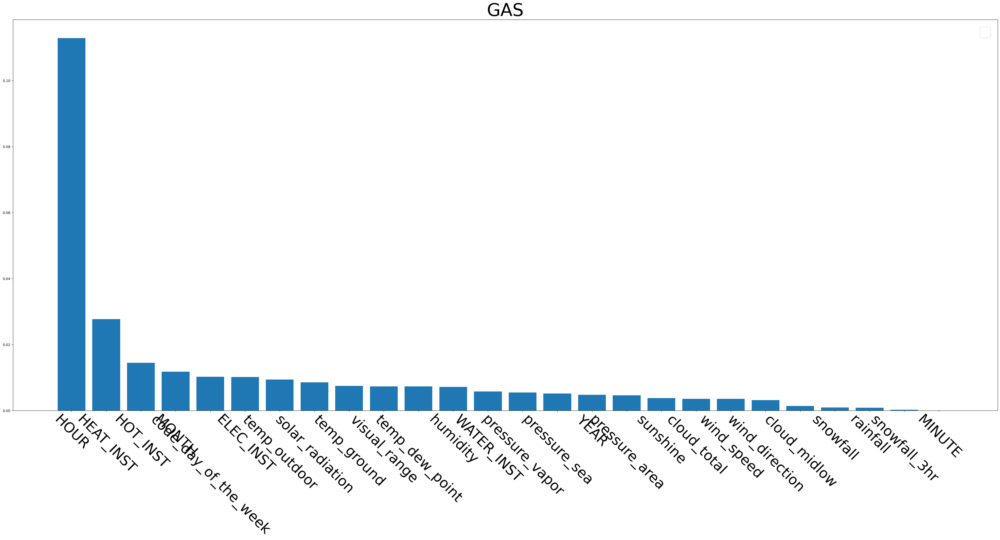

In [ ]:
plt.figure(figsize=(50,20))
str_title = str_domain

plt.bar(df_shap_fin.columns, df_shap_fin.iloc[0])
plt.title(str_title, fontsize = 50)
plt.legend(fontsize = 40)
plt.xticks(fontsize = 40, rotation = -45)